<a href="https://colab.research.google.com/github/jiseonkang2/Tutorials/blob/main/KOHI2021/KOHI2021_DICOM_2_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><strong>Dicom Visualization</strong></h1>


# **준비**

## PyDicom

In [ ]:
pip install pydicom

     |████████████████████████████████| 1.9 MB 5.2 MB/s 


In [ ]:
from pydicom import dcmread

##  DICOM Dataset
- Sample dataset: [download link](https://www.dicomlibrary.com/?manage=1b9baeb16d2aeba13bed71045df1bc65)
- Google Drive 마운트

In [ ]:
!pwd

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls drive/MyDrive/Colab\ Notebooks/KOHI2021/datasets

1b9baeb16d2aeba13bed71045df1bc65.zip  microdicom-3.9.5-x64.zip


In [ ]:
!unzip drive/MyDrive/Colab\ Notebooks/KOHI2021/datasets/1b9baeb16d2aeba13bed71045df1bc65.zip

Archive:  drive/MyDrive/Colab Notebooks/KOHI2021/datasets/1b9baeb16d2aeba13bed71045df1bc65.zip
 extracting: series-000001/image-000001.dcm  
 extracting: series-000001/image-000002.dcm  
 extracting: series-000001/image-000003.dcm  
 extracting: series-000001/image-000004.dcm  
 extracting: series-000001/image-000005.dcm  
 extracting: series-000001/image-000006.dcm  
 extracting: series-000001/image-000007.dcm  
 extracting: series-000001/image-000008.dcm  
 extracting: series-000001/image-000009.dcm  
 extracting: series-000001/image-000010.dcm  
 extracting: series-000001/image-000011.dcm  
 extracting: series-000001/image-000012.dcm  
 extracting: series-000001/image-000013.dcm  
 extracting: series-000001/image-000014.dcm  
 extracting: series-000001/image-000015.dcm  
 extracting: series-000001/image-000016.dcm  
 extracting: series-000001/image-000017.dcm  
 extracting: series-000001/image-000018.dcm  
 extracting: series-000001/image-000019.dcm  
 extracting: series-000001/imag

In [ ]:
!ls

drive  sample_data  series-000001


# **DICOM Volume**

## DICOM Series 읽기
SliceLocation이 없는 이미지는 제외 (e.g. scout views)

In [ ]:
import os, glob

dcm_root = 'series-000001'

slices = []
skipcount = 0

for fname in glob.glob(os.path.join(dcm_root, '*.dcm')):
  s = dcmread(fname)
  if hasattr(s, 'SliceLocation'):
    slices.append(s)
  else:
    skipcount = skipcount + 1
  
print("skipped, no SliceLocation: {}".format(skipcount))

skipped, no SliceLocation: 0


## Slice Location에 따라 정렬하기

In [ ]:
slices = sorted(slices, key=lambda s: s.SliceLocation)

## 3D Numpy Array 생성

In [ ]:
img_shape = list(slices[0].pixel_array.shape)
img_shape.append(len(slices))
img_shape

[512, 512, 361]

In [ ]:
import numpy as np

volume = np.zeros(img_shape) # default dtype=np.float64

for i, s in enumerate(slices):
  px_array = s.pixel_array
  volume[:,:,i] = px_array

## Hounsfield Units (HU)로 변환

In [ ]:
intercept = slices[0].RescaleIntercept
slope = slices[0].RescaleSlope
volume_hu = slope * volume + intercept

print('Intercept:', intercept)
print('Slope:', slope)

Intercept: -1000
Slope: 1


# **Histogram**

| Substance | HU |
|---|---|
| Air | -1000 |
| Lung | -500 |
| Fat | -100 to -50 |
| Water | 0 |
| Blood | +30 to +45 |
| Muscle | +10 to + 40 |
| Liver | +40 to +60 |
| Bone | +700 to +3000 |


Text(0, 0.5, 'Counts')

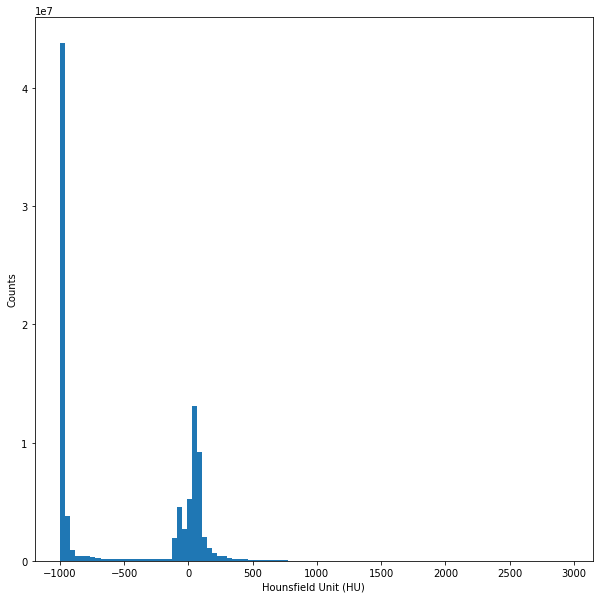

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['image.cmap'] = 'gray'

plt.hist(volume_hu.flatten(), bins=100)
plt.xlabel('Hounsfield Unit (HU)')
plt.ylabel('Counts')

# **Windowing**

In [ ]:
window_center = slices[0].WindowCenter
window_width = slices[0].WindowWidth

print('Window Center:', window_center)
print('Window Width:', window_width)

Window Center: [00050, 00050]
Window Width: [00350, 00350]


In [ ]:
from pydicom.pixel_data_handlers.util import apply_windowing, apply_modality_lut

ori_img = volume[:,:,0]
mod_img = apply_modality_lut(ori_img, slices[0])
win_img = apply_windowing(mod_img, slices[0])

print(f'Original:\t min={ori_img.min()} max={ori_img.max()}')
print(f'Modality_lut:\t min={mod_img.min()} max={mod_img.max()}')
print(f'Windowing:\t min={win_img.min()} max={win_img.max()}')

Original:	 min=0.0 max=2305.0
Modality_lut:	 min=-1000.0 max=1305.0
Windowing:	 min=-1000.0 max=3095.0


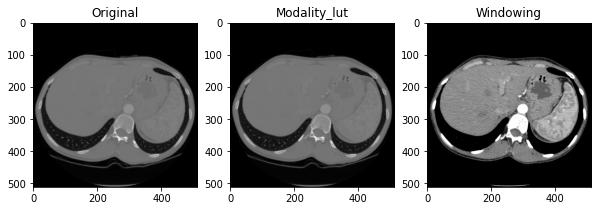

In [ ]:
plt.subplot(1,3,1)
plt.title('Original')
plt.imshow(ori_img, cmap=plt.cm.gray)

plt.subplot(1,3,2)
plt.title('Modality_lut')
plt.imshow(mod_img, cmap=plt.cm.gray)

plt.subplot(1,3,3)
plt.title('Windowing')
plt.imshow(win_img, cmap=plt.cm.gray)

# **Multiplanar Reformation (MPR)**

## Pixel Spacing

In [ ]:
pixel_spacing = slices[0].PixelSpacing
slice_thickness = slices[0].SliceThickness

print('Pixel Spacing:', pixel_spacing)
print('Slice Thickness:', slice_thickness)

Pixel Spacing: [0.58984375, 0.58984375]
Slice Thickness: 1.0


## Pixel Aspects
모든 slice가 같다고 가정함

In [ ]:
# ar_axial = pixel_spacing[1] / pixel_spacing[0]
# ar_sagittal = pixel_spacing[1] / slice_thickness
# ar_coronal = slice_thickness / pixel_spacing[0]

ar_axial = (pixel_spacing[1] * img_shape[1]) / (pixel_spacing[0] * img_shape[0])
ar_sagittal = (pixel_spacing[1] * img_shape[1]) / (slice_thickness * img_shape[2])
ar_coronal = (slice_thickness * img_shape[2]) / (pixel_spacing[0] * img_shape[0])

print('Axial Aspect Ratio:',ar_axial)
print('Sagital Aspect Ratio:',ar_sagittal)
print('Coronal Aspect Ratio:',ar_coronal)

Axial Aspect Ratio: 1.0
Sagital Aspect Ratio: 0.8365650969529086
Coronal Aspect Ratio: 1.195364238410596


## Display (Original)

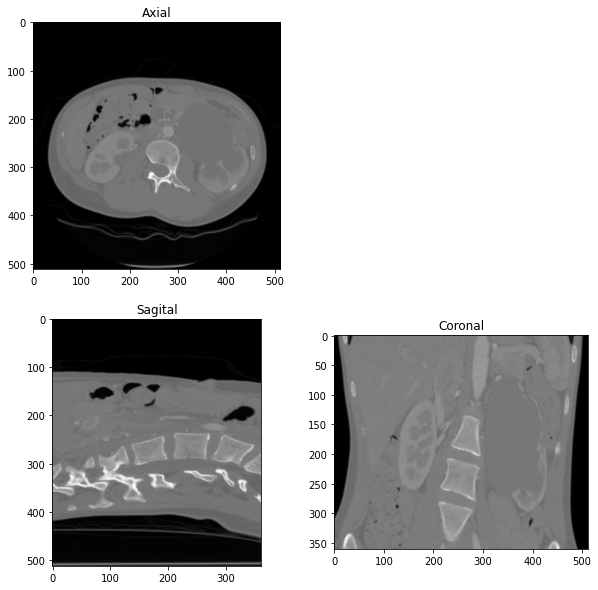

In [ ]:
img_axial = volume[:,:,img_shape[2]//2]
img_sagittal = volume[:,img_shape[1]//2,:]
img_coronal = volume[img_shape[0]//2,:,:].T

axial = plt.subplot(2,2,1)
plt.title('Axial')
plt.imshow(img_axial)
axial.set_aspect(ar_axial)

sagittal = plt.subplot(2,2,3)
plt.title('Sagital')
plt.imshow(img_sagittal)
sagittal.set_aspect(ar_sagittal)

coronal = plt.subplot(2,2,4)
plt.title('Coronal')
plt.imshow(img_coronal)
coronal.set_aspect(ar_coronal)

## Display (Windowing)

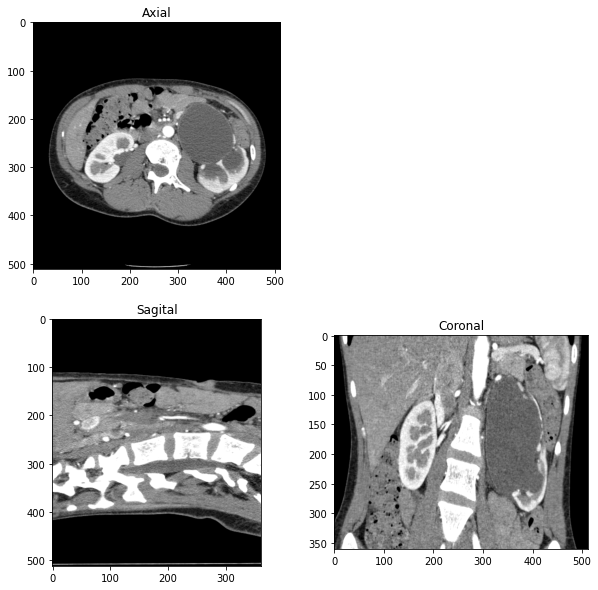

In [ ]:
win_img_axial = apply_windowing(volume_hu[:,:,img_shape[2]//2], slices[0])
win_img_sagittal = apply_windowing(volume_hu[:,img_shape[1]//2,:], slices[0])
win_img_coronal = apply_windowing(volume_hu[img_shape[0]//2,:,:].T, slices[0])

axial = plt.subplot(2,2,1)
plt.title('Axial')
plt.imshow(win_img_axial)
axial.set_aspect(ar_axial)

sagittal = plt.subplot(2,2,3)
plt.title('Sagital')
plt.imshow(win_img_sagittal)
sagittal.set_aspect(ar_sagittal)

coronal = plt.subplot(2,2,4)
plt.title('Coronal')
plt.imshow(win_img_coronal)
coronal.set_aspect(ar_coronal)

# **Isosurface Rendering**

## Resampling

In [ ]:
from scipy.ndimage import interpolation

In [ ]:
def resample(src_volume, src_spacing, dest_spacing=[1,1,1]):

  resize_factor = src_spacing / dest_spacing
  dest_shape = np.round(src_volume.shape * resize_factor)
  zoom = dest_shape / src_volume.shape

  dest_volume = interpolation.zoom(src_volume, zoom)
  dest_spacing = src_spacing / zoom

  return dest_volume, dest_spacing

In [ ]:
spacing = np.array([ float(slice_thickness), float(pixel_spacing[0]), float(pixel_spacing[1]) ])
resampled_volume, resampled_spacing = resample(volume_hu, spacing, dest_spacing=2)

print('shape before resampling:', spacing)
print('shape after reampling:', resampled_spacing)

shape before resampling: [1.         0.58984375 0.58984375]
shape after reampling: [2.         2.         2.00880749]


## Marching Cube
![marchingCube](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a7/MarchingCubes.svg/1280px-MarchingCubes.svg.png)

In [ ]:
from skimage import measure

def make_mesh(image, threshold=300, step_size=1):
    p = image.transpose(2,1,0)
    verts, faces, norm, val = measure.marching_cubes_lewiner(p, threshold, step_size=step_size, allow_degenerate=True) 
    return verts, faces

In [ ]:
verts, faces = make_mesh(resampled_volume, threshold=350)

## Display (static)

In [ ]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

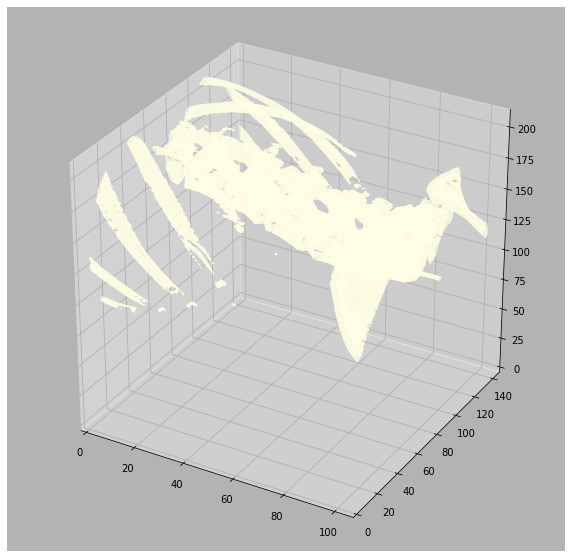

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Fancy indexing: `verts[faces]` to generate a collection of triangles
mesh = Poly3DCollection(verts[faces], linewidths=0.05, alpha=1)
face_color = [1, 1, 0.9]
mesh.set_facecolor(face_color)
ax.add_collection3d(mesh)

x,y,z = zip(*verts) 
ax.set_xlim(0, max(x))
ax.set_ylim(0, max(y))
ax.set_zlim(0, max(z))
ax.set_facecolor((0.7, 0.7, 0.7))

plt.show()

## Display (interactive)

In [ ]:
from plotly.offline import iplot
from plotly import figure_factory as FF

In [ ]:
x,y,z = zip(*verts) 

# Make the colormap single color since the axes are positional not intensity. 
#    colormap=['rgb(255,105,180)','rgb(255,255,51)','rgb(0,191,255)']
colormap=['rgb(236, 236, 212)','rgb(236, 236, 212)']

fig = FF.create_trisurf(x=x, y=y, z=z, 
                    plot_edges=False,
                    colormap=colormap,
                    simplices=faces,
                    backgroundcolor='rgb(64, 64, 64)',
                    title="Interactive Visualization")
iplot(fig)